In [74]:
import os
import itertools

import pandas as pd
import matplotlib.pyplot as plt

In [114]:
R2 = pd.read_excel('results/OOS_R2_0709.xlsx', header=[0,1], index_col=0, sheet_name = 'sin_func')

In [115]:
R2.head()

Variable         co1                                                co2  \
Model          SM_R2    NLS_R2    AR1_R2    AR2_R2 AR_cay_R2      SM_R2   
time                                                                      
1988-03-01  0.584104 -4.080788  0.893109  0.923957  0.911773  -1.701649   
1988-06-01  0.924286  0.058669  0.910932 -3.077047  0.924762   0.144266   
1988-09-01  0.831588 -0.198805  0.883200  0.823282  0.843592   0.279688   
1988-12-01  0.932767  0.811670  0.970848  0.993934  0.989717 -24.942041   
1989-03-01  0.979473 -0.252204  0.979053  0.974962  0.982572  -1.227389   

Variable                                                      co3            \
Model         NLS_R2     AR1_R2     AR2_R2 AR_cay_R2        SM_R2    NLS_R2   
time                                                                          
1988-03-01 -5.020659   0.305641   0.506026  0.426880   -15.714095 -2.180864   
1988-06-01 -0.125178  -0.006660 -45.079646  0.149646   -17.648910 -0.252328   
1988-09-01  0.176469   0.500437   0.244162  0.331029   -35.739030 -0.384497   
1988-12-01 -1.421220 -10.248341  -1.340496 -2.967592 -1742.782296 -0.342091   
1989-03-01 -0.179533  -1.272913  -1.716859 -0.891057   -28.038509 -0.190219   

Variable                                              co4                      \
Model           AR1_R2       AR2_R2   AR_cay_R2     SM_R2    NLS_R2    AR1_R2   
time                                                                            
1988-03-01   -3.295743    -2.056031   -2.545681 -3.829499 -3.177733 -0.241245   
1988-06-01  -20.938016 -1003.207883  -17.531659 -0.087252  0.033501 -0.279010   
1988-09-01  -24.479876   -37.550992  -33.120426  0.023849 -0.184380  0.323003   
1988-12-01 -755.095357  -156.324380 -265.695130 -6.550266 -2.519499 -2.273758   
1989-03-01  -28.632004   -34.419727  -23.653736 -0.140655 -0.121056 -0.163968   

Variable                         
Model          AR2_R2 AR_cay_R2  
time                             
1988-03-01   0.116967 -0.024516  
1988-06-01 -57.546407 -0.080416  
1988-09-01  -0.024294  0.093425  
1988-12-01   0.318814 -0.154742  
1989-03-01  -0.391314  0.031582

In [51]:
R2[R2 < -1] = -1

In [ ]:
fun_list = ['sin_func', 
            'cos_func', 
            'scaled_sin_func', 
            'scaled_cos_func', 
            'exp_shift_func', 
            'exp_func', 
            'poly_func', 
            'linear_func']

In [121]:
co_list = ['co1', 'co2', 'co3', 'co4']
bm_list = ['SM_R2', 'NLS_R2', 'AR1_R2', 'AR2_R2', 'AR_cay_R2']

In [122]:
co_dict = {'co1': 'dy and dp',
          'co2': 'tbl and lty',
          'co3': 'dp and ep',
          'co4': 'BAA and AAA'}

In [98]:
parent = os.getcwd()
folder = 'OOS_plots'
path = os.path.join(parent, folder)
if not os.path.exists(path):
    os.makedirs(path)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


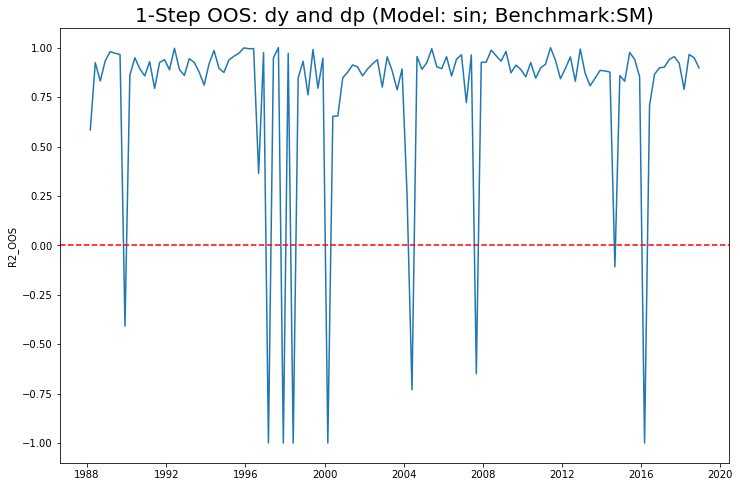

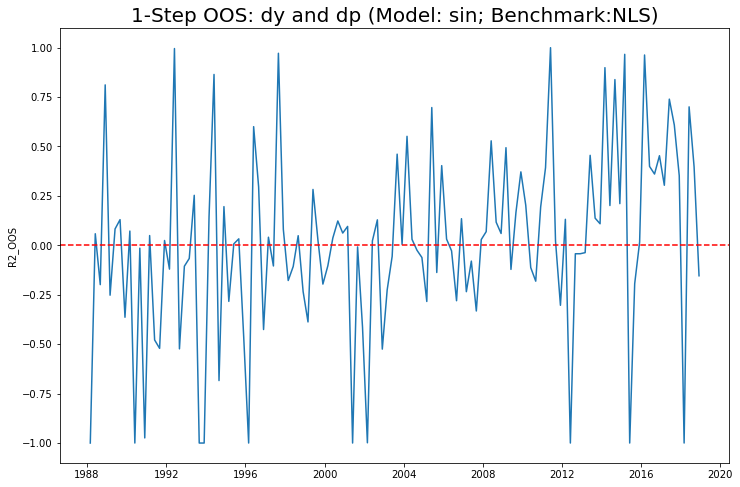

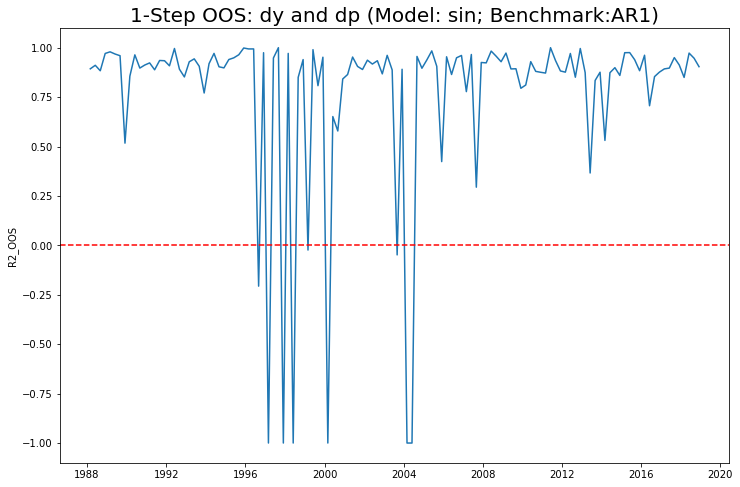

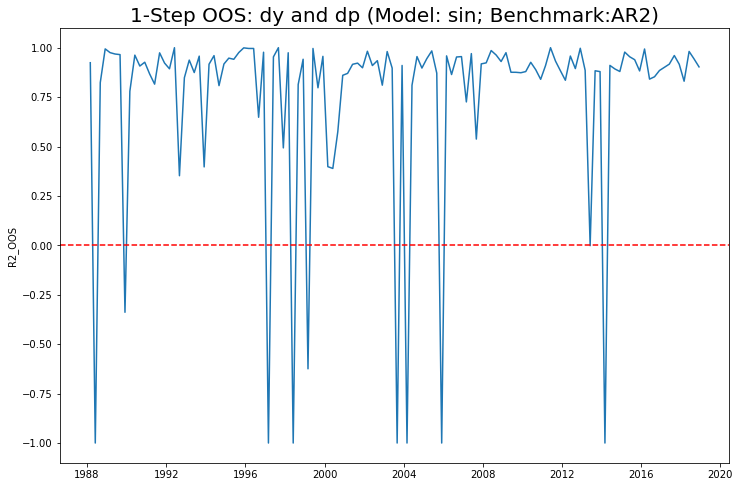

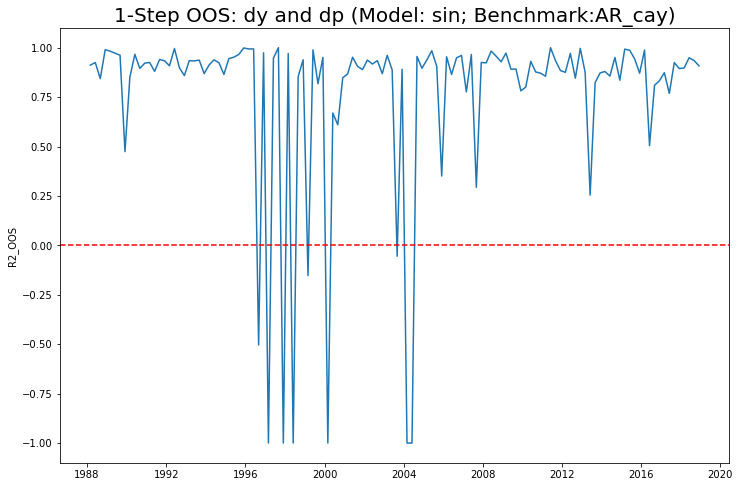

...

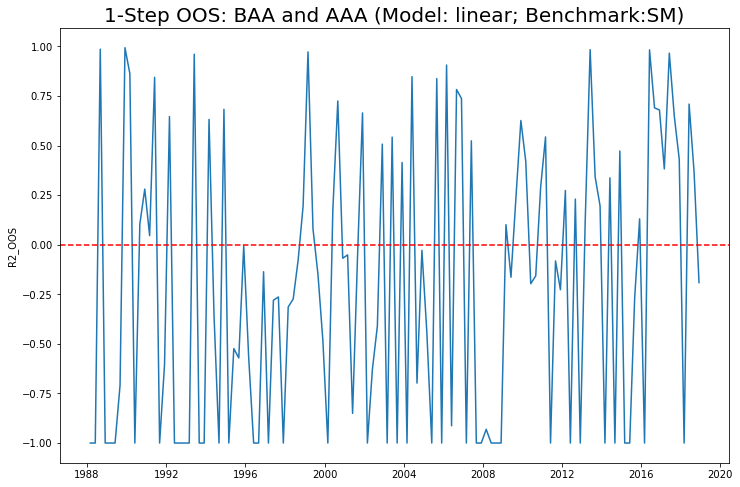

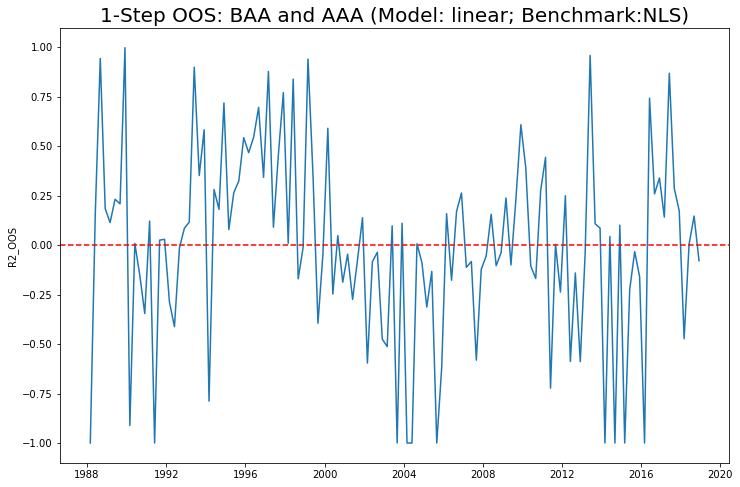

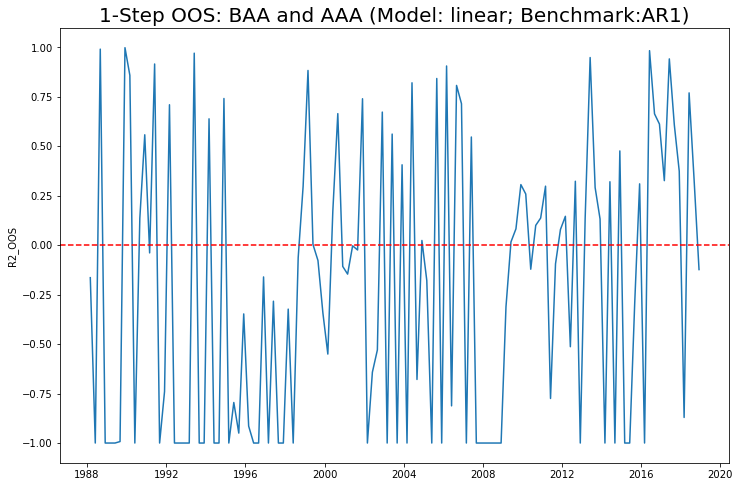

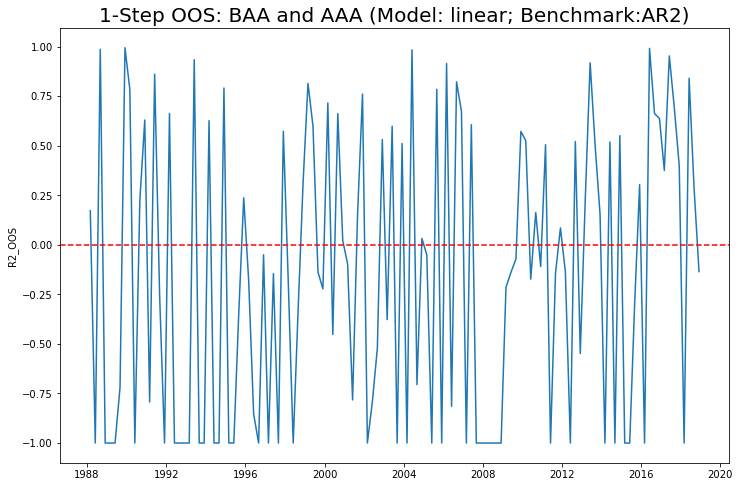

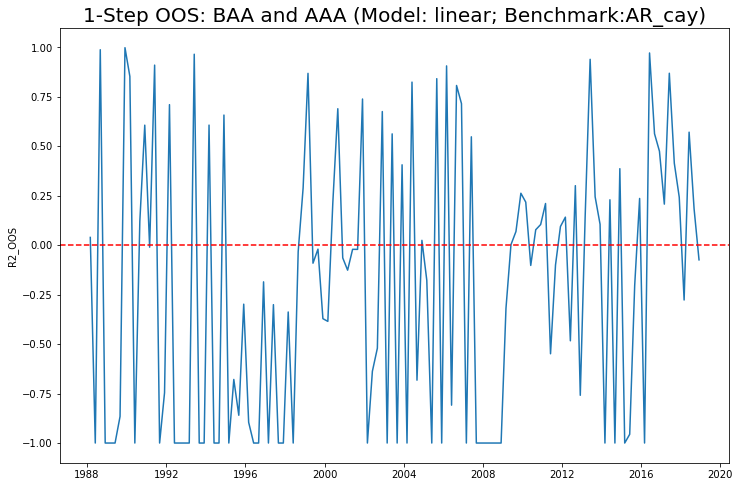

In [133]:
for k in fun_list:
    R2 = pd.read_excel('results/OOS_R2_0709.xlsx', header=[0,1], index_col=0, sheet_name = k)
    R2[R2 < -1] = -1
    for i,j in itertools.product(co_list, bm_list):
        fig = plt.figure(figsize = (12,8))
        plt.plot(R2[i][j])
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('1-Step OOS: '+ co_dict[i] + ' (' + 'Model: '+ k[:-5] + '; Benchmark:' + j[:-3] + ')', fontsize=20)
        plt.ylabel("R2_OOS")
        plt.savefig(os.path.join(path, k[:-5] + '_' + i + '_' + j[:-3]), dpi=400)

In [117]:
posit_ratio = pd.DataFrame()
for k in fun_list:
    R2 = pd.read_excel('results/OOS_R2_0709.xlsx', header=[0,1], index_col=0, sheet_name = k)
    R2_posit = R2>0
    posit_ratio[k] = R2_posit.sum(axis = 0)/R2.shape[0]

In [119]:
posit_ratio.to_excel('results/posit_ratio.xlsx')